# Splane tutorial: Identification of uniform spatial domain in multiple slices

September 2022

Dataset: 11 Visium slices of human breast cancer ([here](#)).

In [1]:
import os,sys
from SPACEL.setting import set_environ_seed
set_environ_seed(42)
from SPACEL import Splane

import scanpy as sc
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.serif'] = ['Arial']
sc.settings.set_figure_params(dpi=100,dpi_save=300,facecolor='white',frameon=False,fontsize=10,vector_friendly=True,figsize=(3,3))

Setting environment seed: 42


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/numba/core/cpu.py:97: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  numba.core.entrypoints.init_all()


In [2]:
od = '/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/cellbin_v3/SPACEL/Splane_cellbin/n_cluster_20_n_neighbors_8_k_2_gnn_dropout_0.8'
os.system(f'mkdir -p {od}')
os.chdir(od)
save_path=f'{od}/Splane_models/'

In [3]:
import yaml
with open('/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/cellbin_v3/sample.yaml', 'r') as file:
    sample_dict = yaml.safe_load(file)

## Spatial transcriptomic data import

The input data type of Splane is a list of anndata objects for each slice from Spoint. If users use cell type composition from other deconvoluiton methods, the anndata objects of each slice must contain cell type composition in `.obs` and cell types name in `.uns['celltypes']`

In [4]:
samplelist = [
    "SS200000148TR_D1", "SS200000118TL_C1", "SS200000131TR_C4",
    "SS200000133TL_C4", "SS200000148TR_E6", "SS200000495BR_B1",
    "SS200000495BR_B2", "SS200000495BR_B5", "SS200000495BR_C5",
    "SS200000495BR_D5", "SS200000495BR_E3"
]



In [5]:
# 注意scRNA embedding tag要保持一致，不一致的添加一列全0使其一致
adata_tmp = sc.read(f'/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/cellbin_v2/SPACEL/Spoint_cellbin/SS200000118TL_C1/Spiont_SS200000118TL_C1.h5ad')
celltypelist = adata_tmp.uns['celltypes']
st_ad_list = []
for sample in samplelist:
    adata = sc.read_h5ad(f'/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/cellbin_v2/SPACEL/Spoint/{sample}/Spiont_{sample}.h5ad')
    adata.uns['celltypes'] = celltypelist
    for celltype in celltypelist:
        if celltype not in adata.obs.columns:
            adata.obs[celltype] = 0
    st_ad_list.append(adata)

In [6]:
# adata = st_ad_list[0]
# adata.obsm['X_sc'] = adata.obs[[c for c in adata.uns['celltypes']]].values

## Training Splane model

In this step, we initialize the Splane model by ``Splane.init_model(...)`` using the anndata object list as input. The ``n_clusters`` parameter determines the number of spatial domains to be identified. The ``k`` parameter controls the degree of neighbors considered in the model, with a larger ``k`` value resulting in more emphasis on global structure rather than local structure. The ``gnn_dropout`` parameter influences the level of smoothness in the model’s predictions, with a higher ``gnn_dropout`` value resulting in a smoother output that accommodates the sparsity of the spatial transcriptomics data. 

We train the model by ``splane.train(...)`` to obtain latent feature of each spots/cells. The parameter ``d_l`` affects the level of batch effect correction between slices. By default, ``d_l`` is ``0.2`` for spatial transcriptomics data with single cell resolution.

Then, we can identify the spatial domain to which each spot/cell belongs by ``splane.identify_spatial_domain(...)``. By default, the results will be saved in ``spatial_domain`` column in ``.obs``. If the key parameter is provided, the results will be saved in ``.obs[key]``.

In [ ]:
splane = Splane.init_model(st_ad_list, n_clusters=20,use_gpu=False,n_neighbors=8,k=2,gnn_dropout=0.8) 

Here, we train the model to obtain latent feature of each spots/cells. The parameter `d_l` affects the level of batch effect correction between slices. By default, `d_l` is `0.2`.

In [13]:
splane.train(d_l=0.2,save_path=save_path)

### Update best model
Epoch 0 train g loss=-6.768301010131836 g loss=-6.288912773132324 d loss=2.396939992904663 acc=0.10713780671358109 simi loss=-0.9234142303466797 db loss=2.0133601914463757
### Update best model
Epoch 5 train g loss=-7.289729595184326 g loss=-6.8172197341918945 d loss=2.3625495433807373 acc=0.11871704459190369 simi loss=-0.9842092394828796 db loss=1.4931066550661967
### Update best model
Epoch 10 train g loss=-7.371485233306885 g loss=-6.900129318237305 d loss=2.3567802906036377 acc=0.11505300551652908 simi loss=-0.9906485676765442 db loss=1.4246071180728967
### Update best model
Epoch 15 train g loss=-7.382649898529053 g loss=-6.911629676818848 d loss=2.355100154876709 acc=0.12916553020477295 simi loss=-0.992493212223053 db loss=1.3961173764747956
### Update best model
Epoch 20 train g loss=-7.385192394256592 g loss=-6.9137492179870605 d loss=2.3572168350219727 acc=0.11579233407974243 simi loss=-0.9931973814964294 db loss=1.3236660264415532
Epoch 25 train g loss=-

Then, we can identify the spatial domain to which each spot/cell belongs. By default, the results will be saved in `spatial_domain` column in `.obs`. If the `key` parameter is provided, the results will be saved in `.obs[key]`.

In [ ]:
splane.identify_spatial_domain()

## Plot spatial domain results

In [18]:
merged_adata = sc.AnnData.concatenate(*st_ad_list, join='inner',batch_categories=samplelist,batch_key='batch')
merged_adata.write("big_cell_merged_adata.h5ad")

In [19]:
merged_adata.var_names

Index(['A1CF', 'A2M', 'AAK1', 'AASS', 'AATBC', 'ABCA1', 'ABCA5', 'ABCA6',
       'ABCA8', 'ABCA9',
       ...
       'ZNF385D', 'ZNF483', 'ZNF521', 'ZNF536', 'ZNF609', 'ZNF683', 'ZNF704',
       'ZNF831', 'ZNF90', 'ZWINT'],
      dtype='object', length=3878)

In [7]:
merged_adata = sc.read('cellbin_merged_adata.h5ad')

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/envs/SPACEL/lib/python3.8/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/envs/SPACEL/lib/python3.8/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/envs/SPACEL/lib/python3.8/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/envs/SPACEL/lib/python3.8/site-packages/scanpy/plotting/_utils

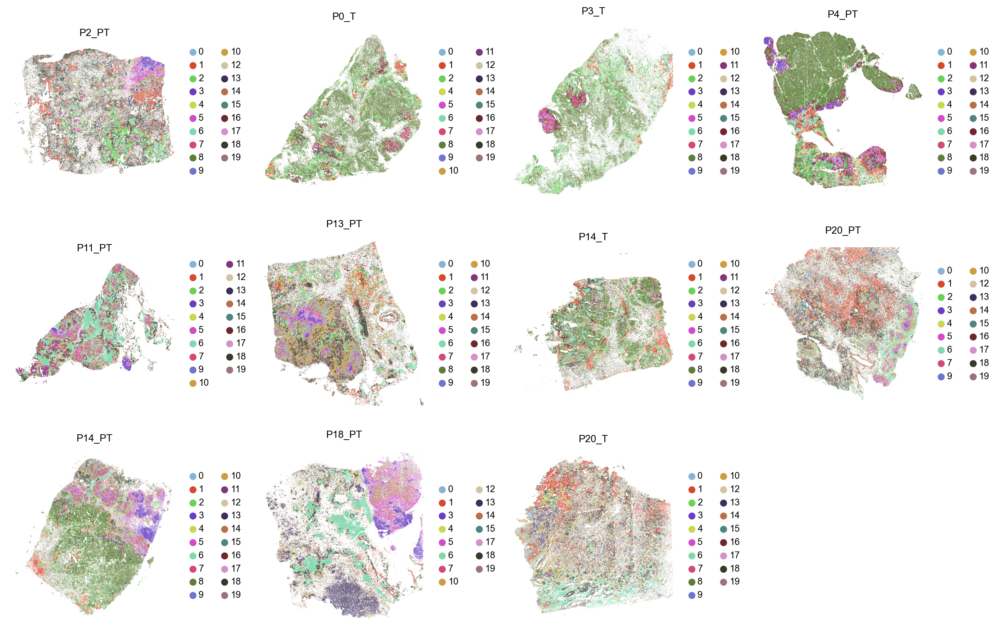

In [6]:
import matplotlib.pyplot as plt

sys.path.insert(
    0,
    '/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/yixianai/SC_reanalysis/script'
)
from utils import getDefaultColors, removeBiasGenes
# 11 sample with 3row 4col figure
cluster_number = merged_adata.obs['spatial_domain'].cat.categories.shape[0]
colors = getDefaultColors(cluster_number, type=2)
clusters_colors = dict(zip(range(cluster_number), colors))
fig, axs = plt.subplots(3, 4, figsize=(14, 9))
fig.tight_layout() 
plt.axis('off')
for i, sample in enumerate(samplelist):
    nrow = i // 4
    ncol = i % 4
    ad = merged_adata[merged_adata.obs['batch'] == sample]
    sc.pl.spatial(ad,
                  color='spatial_domain',
                  ax=axs[nrow, ncol],
                  show=False,
                  spot_size=30,
                  title=sample_dict[sample],
                  palette=[
                      v for k, v in clusters_colors.items()
                      if k in ad.obs.spatial_domain.unique().tolist()
                  ])
fig.savefig('spatial_domain.pdf', bbox_inches='tight')


In [8]:
merged_adata.obs[['spatial_domain']].to_csv('spatial_domain.csv')

In [8]:
merged_adata = sc.read('/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/cellbin_v3/1.1_cellbin_rawdata/filtered_data/merged_adata.h5ad')

In [9]:
import pandas as pd
spatial_domain = pd.read_csv('spatial_domain.csv',index_col=0)
# remove the str after the last '-' 
spatial_domain.index = spatial_domain.index.str.rsplit('-',1).str[0]

In [10]:
merged_adata.obs['community_type'] = spatial_domain['spatial_domain'].astype('str')

In [11]:
merged_adata.obs['community_type'] = spatial_domain['spatial_domain'].astype('category')

In [21]:
merged_adata.obs['community_type'].value_counts()

8           300327
18          269136
6           188012
1           158499
10          138237
19          107614
2            95006
0            77585
14           77356
15           73292
4            66059
13           62115
5            52061
3            38296
17           33472
16           27507
7            19643
12           16986
11           10656
9             4838
Unsigned         1
Name: community_type, dtype: int64

In [13]:
merged_adata.write('/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/cellbin_v3/1.1_cellbin_rawdata/filtered_data/merged_adata.h5ad')

In [18]:
od = '/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/cellbin_v3/3.2_cellbin_communities_spacel2'
os.system(f'mkdir -p {od}')
os.chdir(od)

In [22]:
merged_adata.obs['community_type'] = merged_adata.obs['community_type'].cat.add_categories('Unsigned')
merged_adata.obs['community_type'][merged_adata.obs['community_type'].isna()] = 'Unsigned'

In [23]:
merged_adata.obs['batch'].value_counts()

SS200000495BR_E3    207940
SS200000495BR_B5    196242
SS200000495BR_D5    191605
SS200000495BR_B1    191545
SS200000495BR_C5    190715
SS200000148TR_D1    167448
SS200000495BR_B2    157281
SS200000148TR_E6    150925
SS200000133TL_C4    136778
SS200000131TR_C4    113331
SS200000118TL_C1    112888
Name: batch, dtype: int64

/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


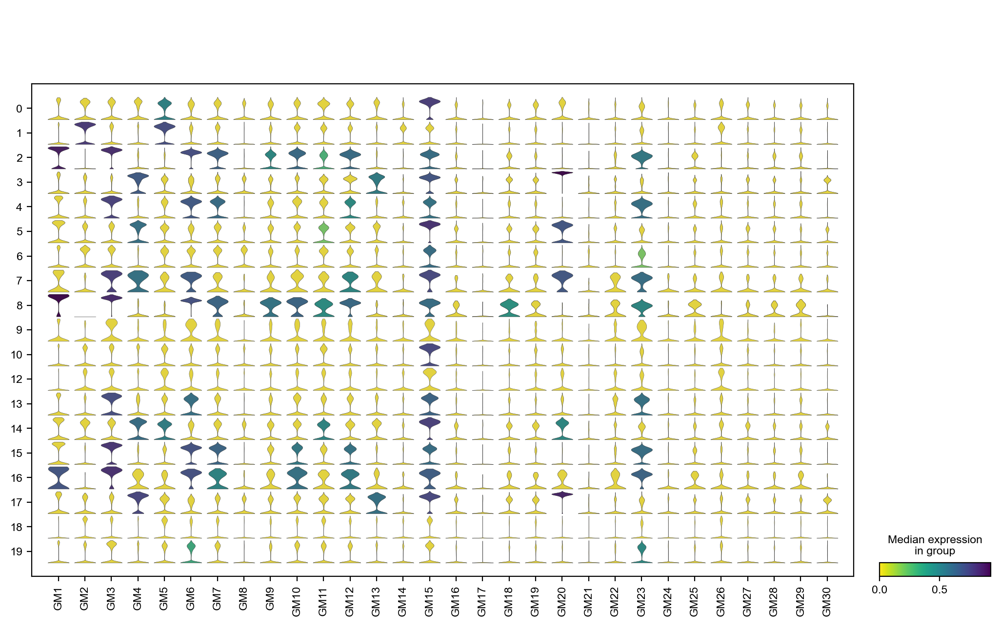

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


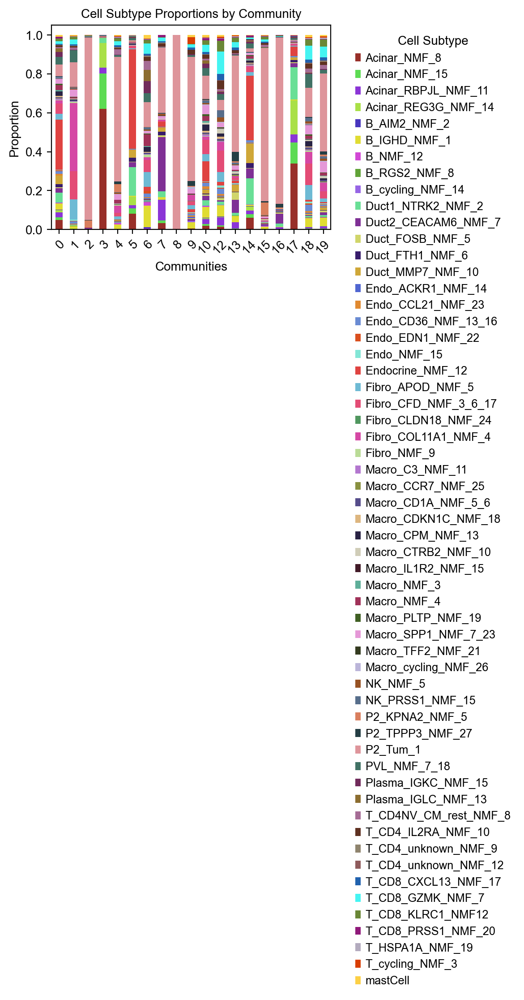

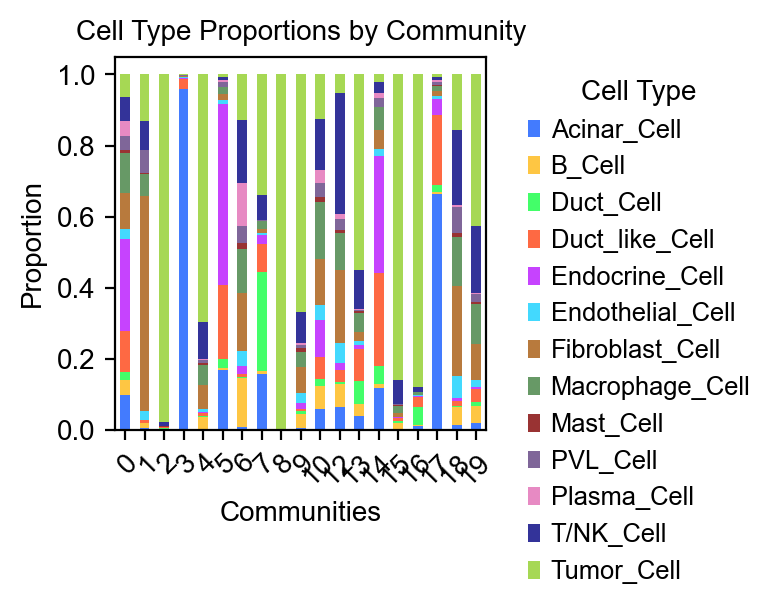

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


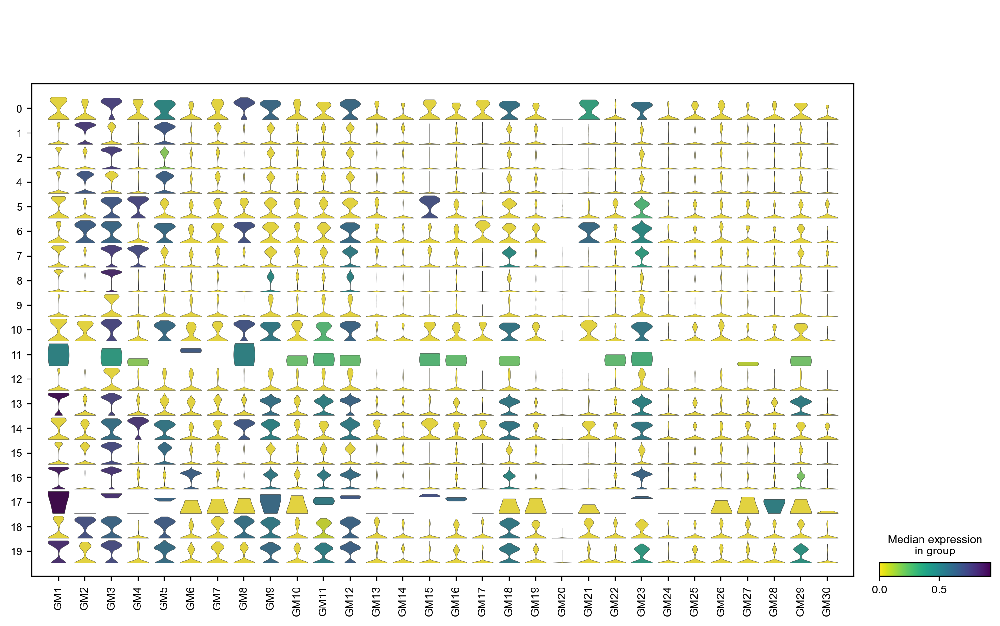

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


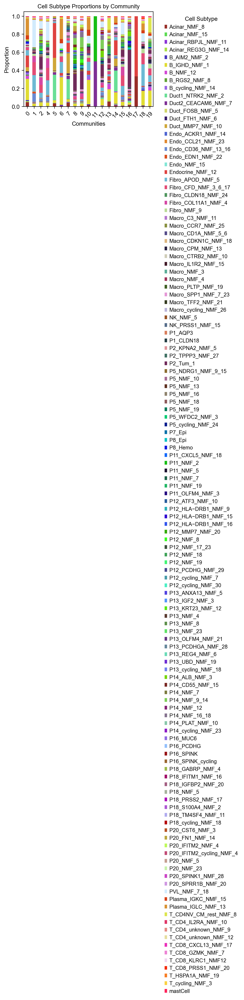

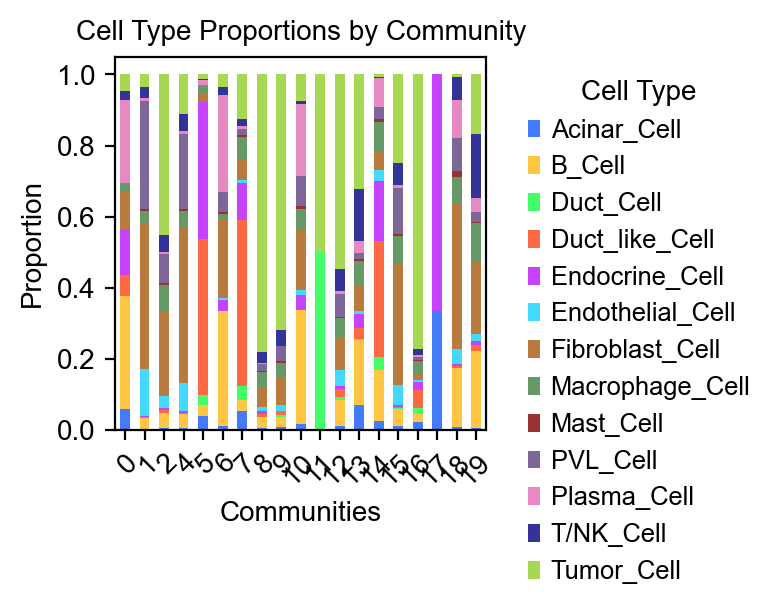

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


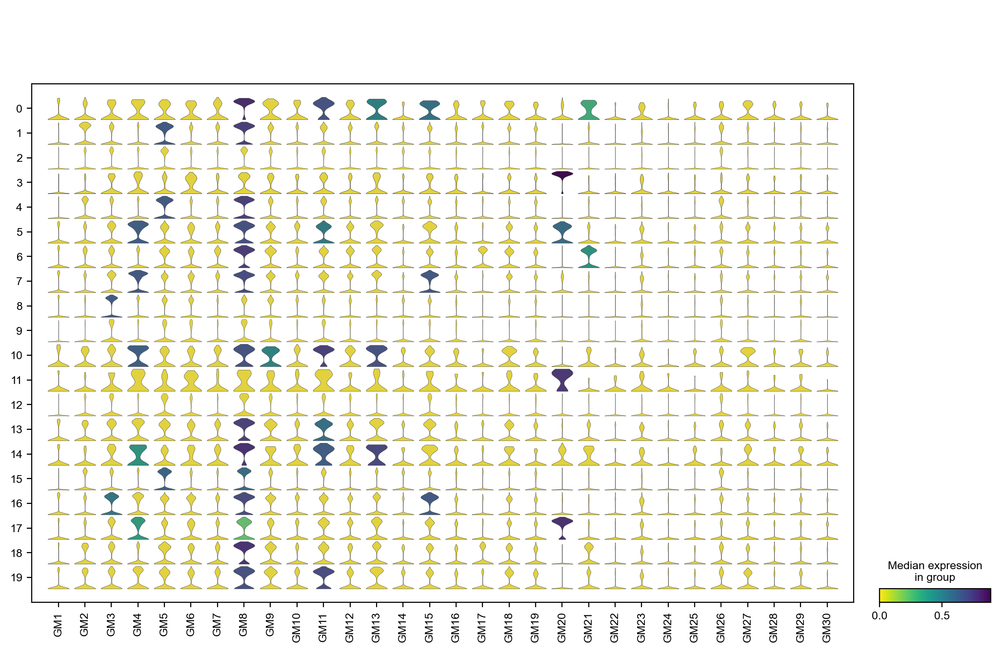

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


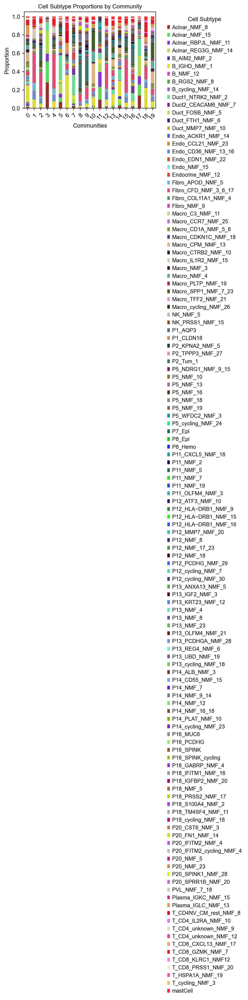

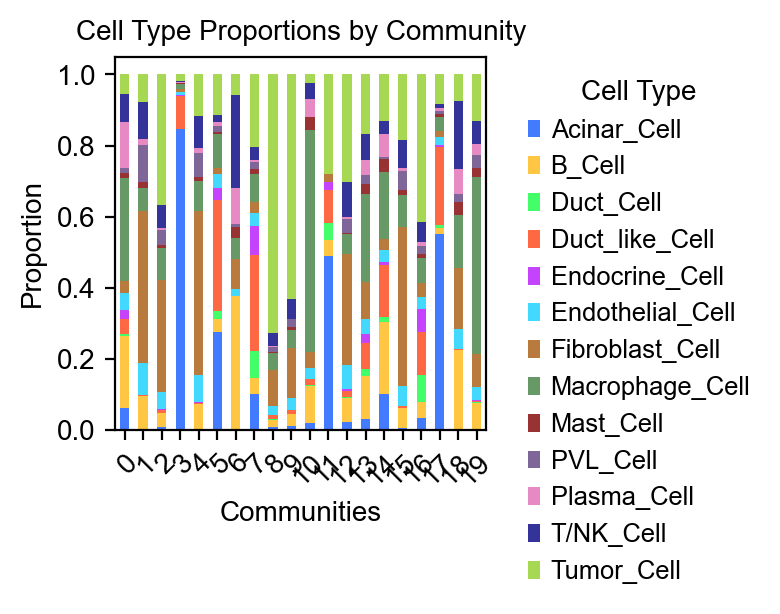

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


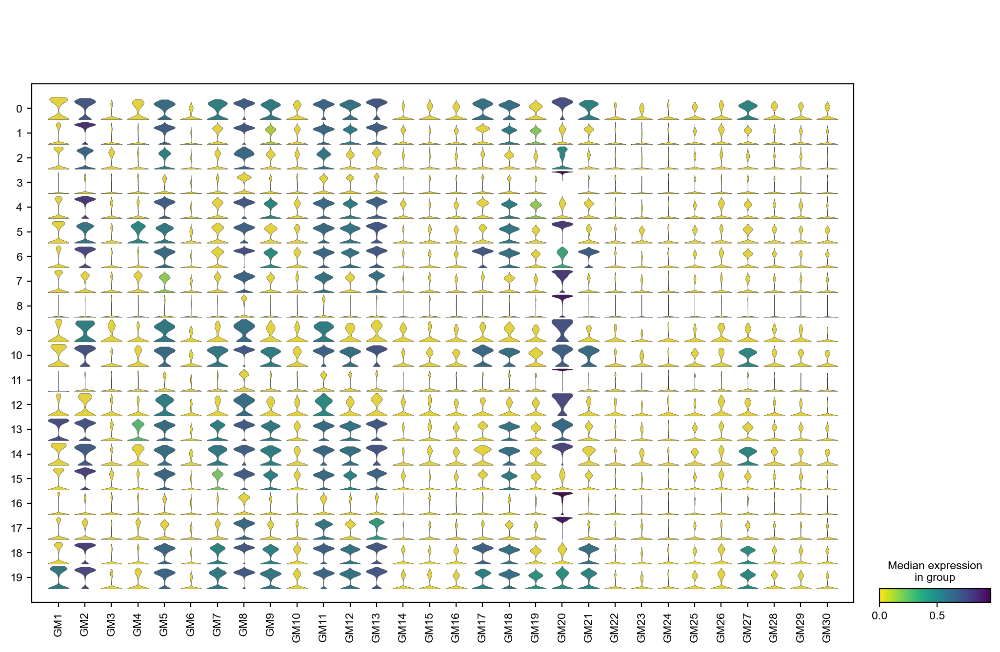

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


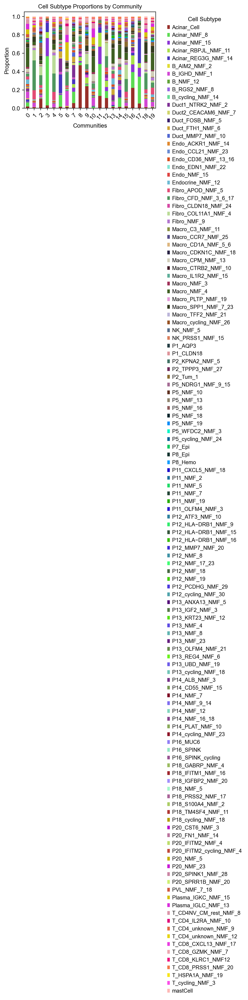

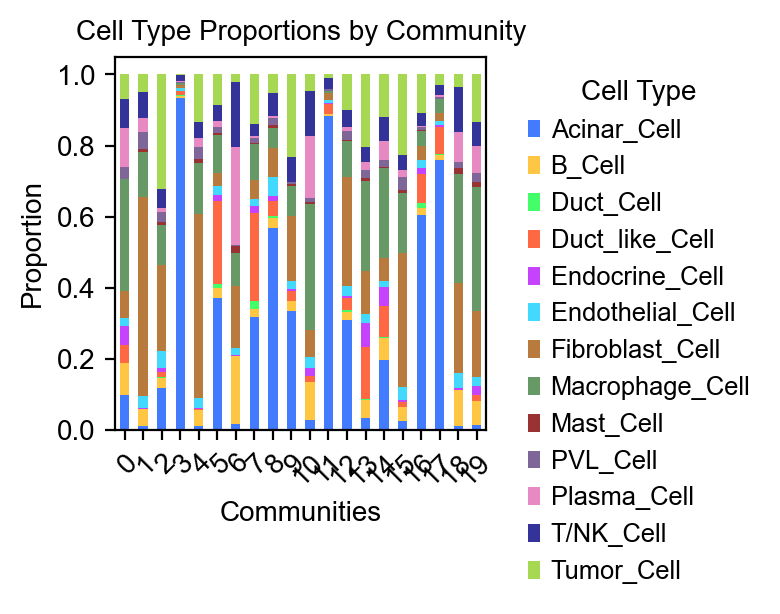

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


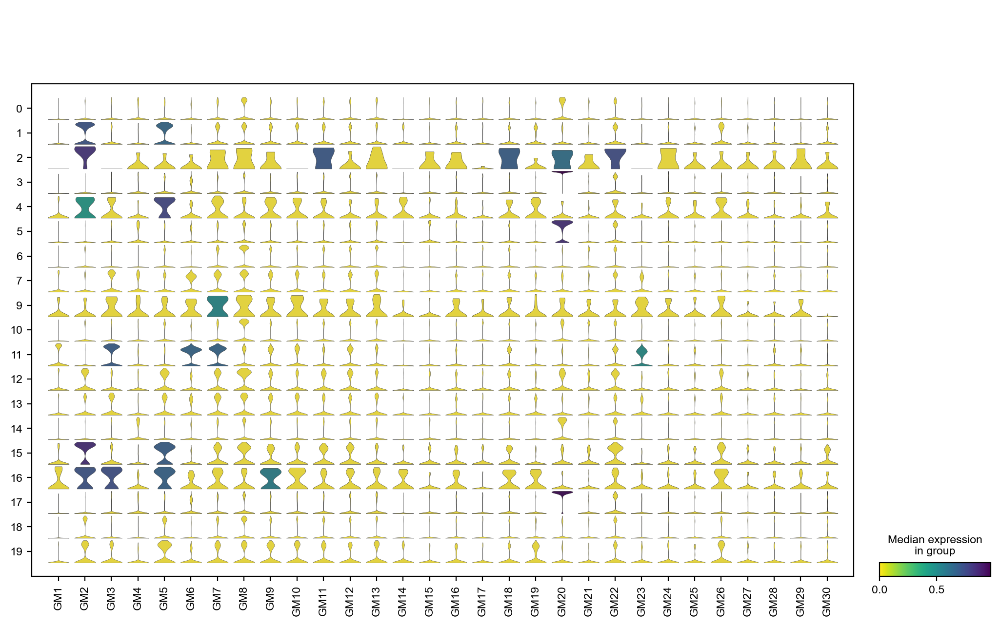

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


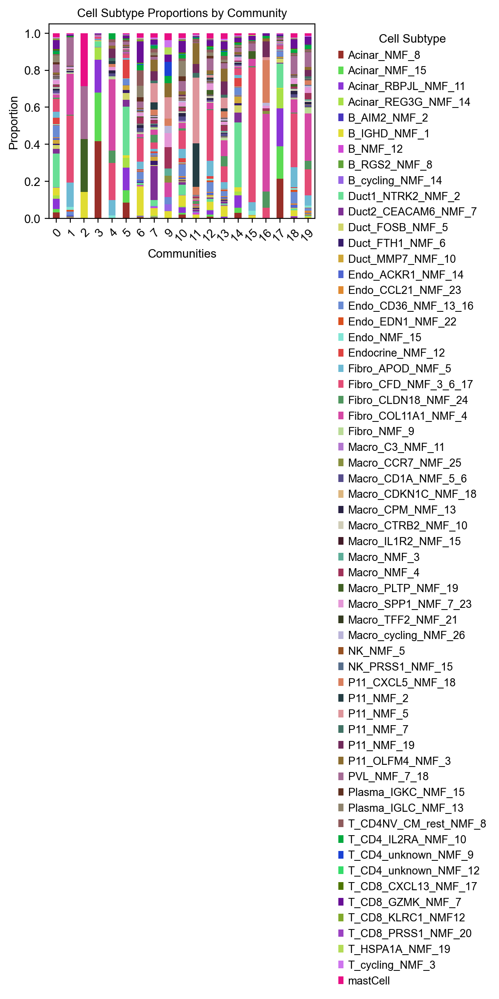

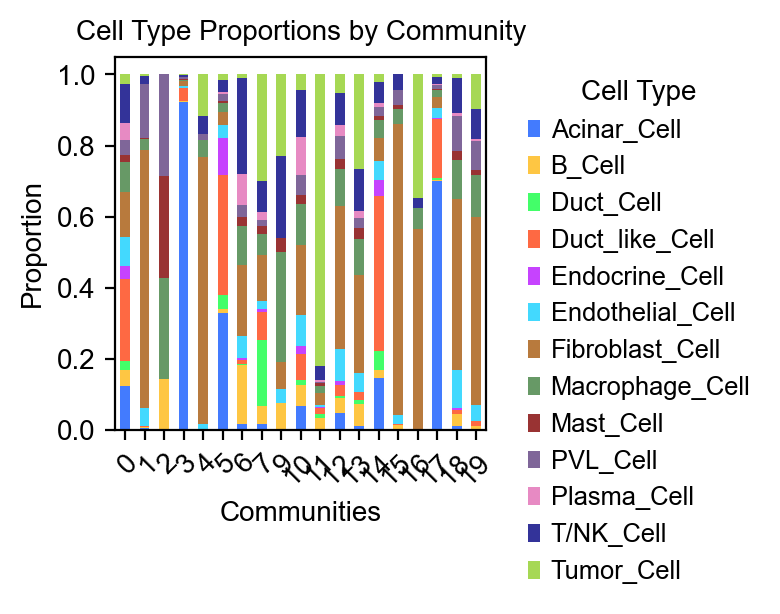

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


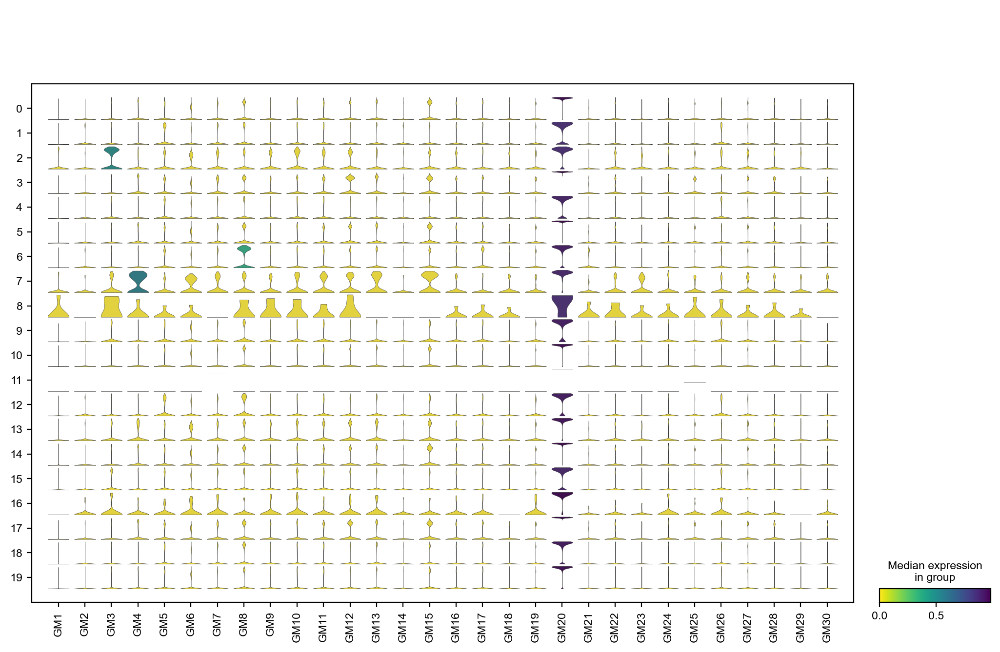

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


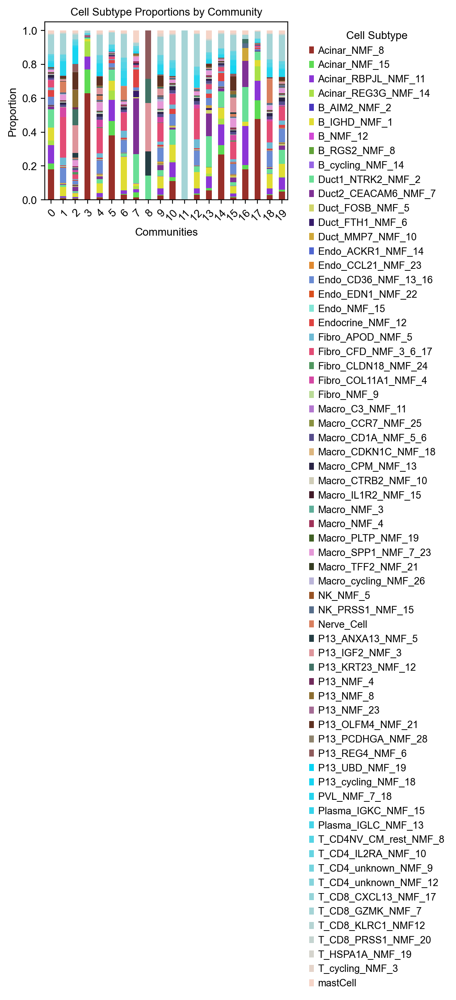

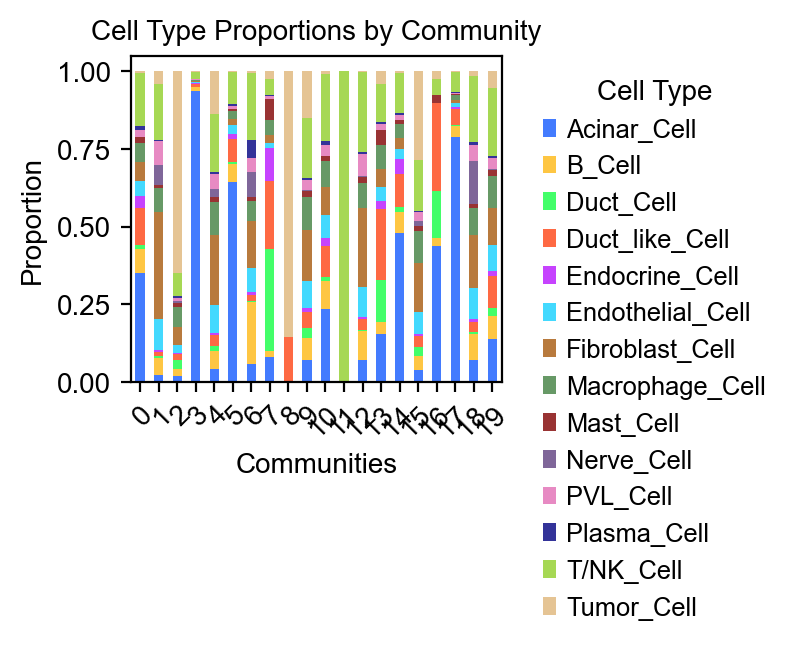

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


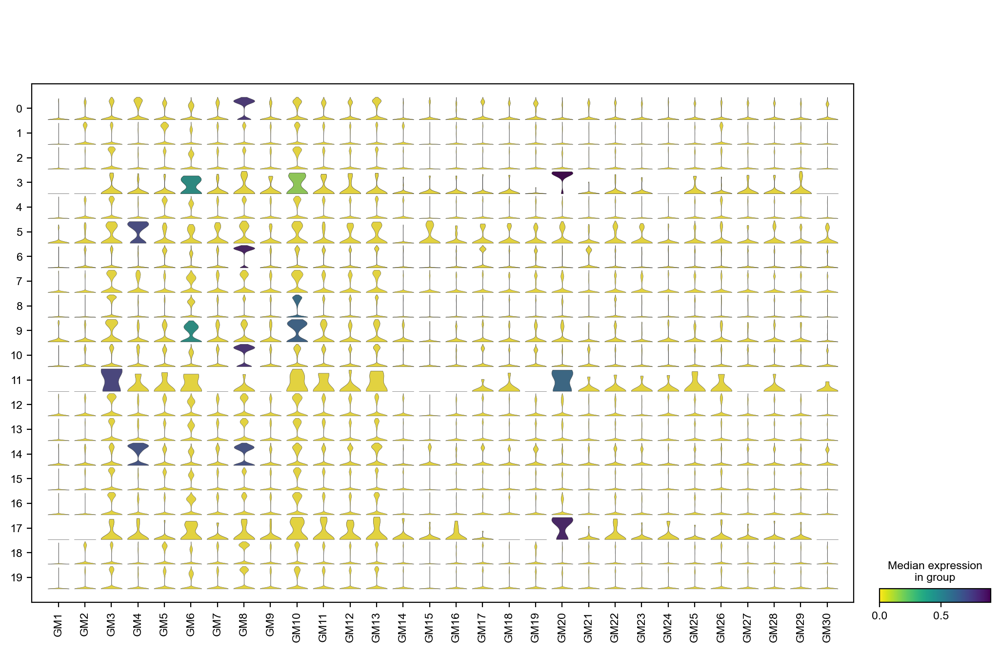

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


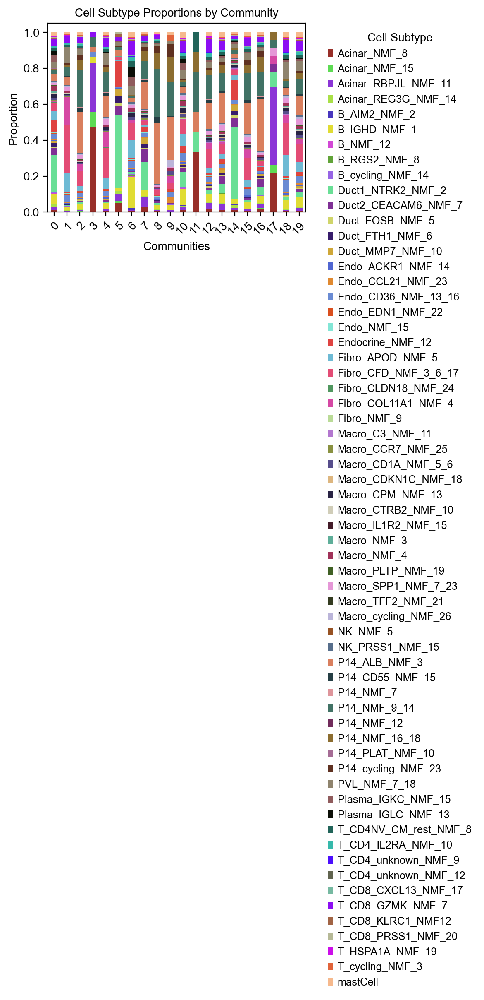

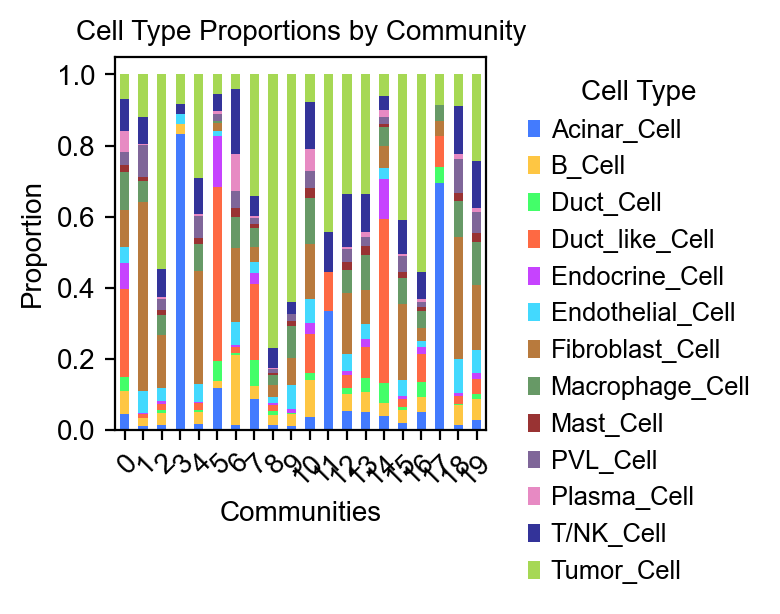

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


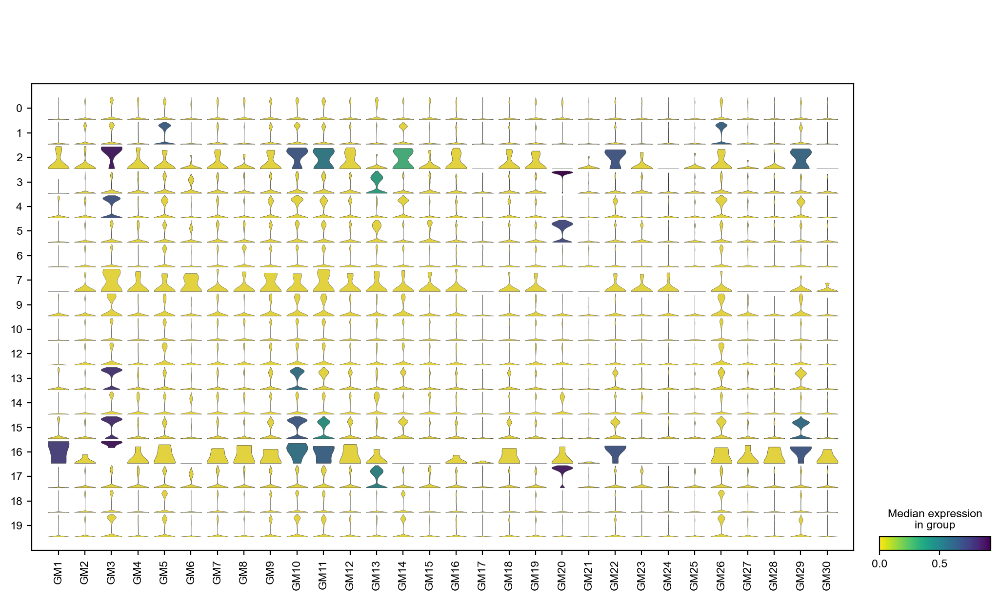

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


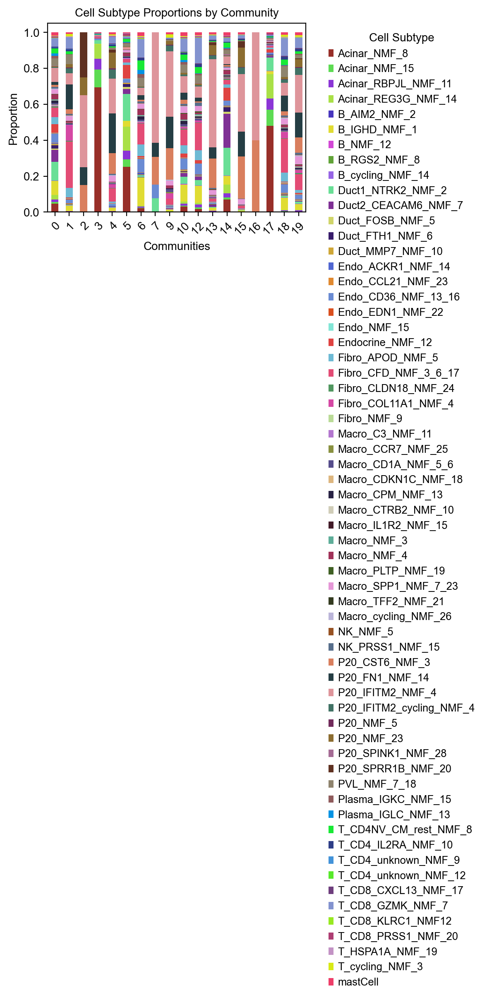

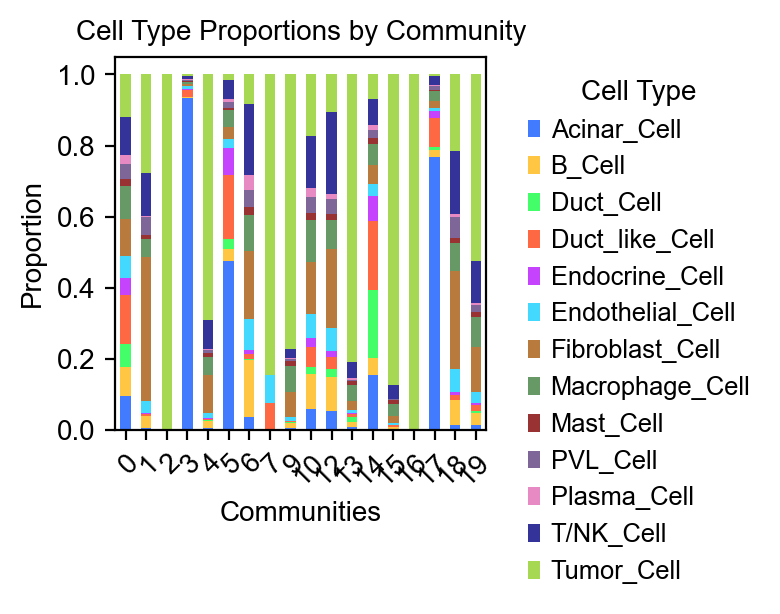

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


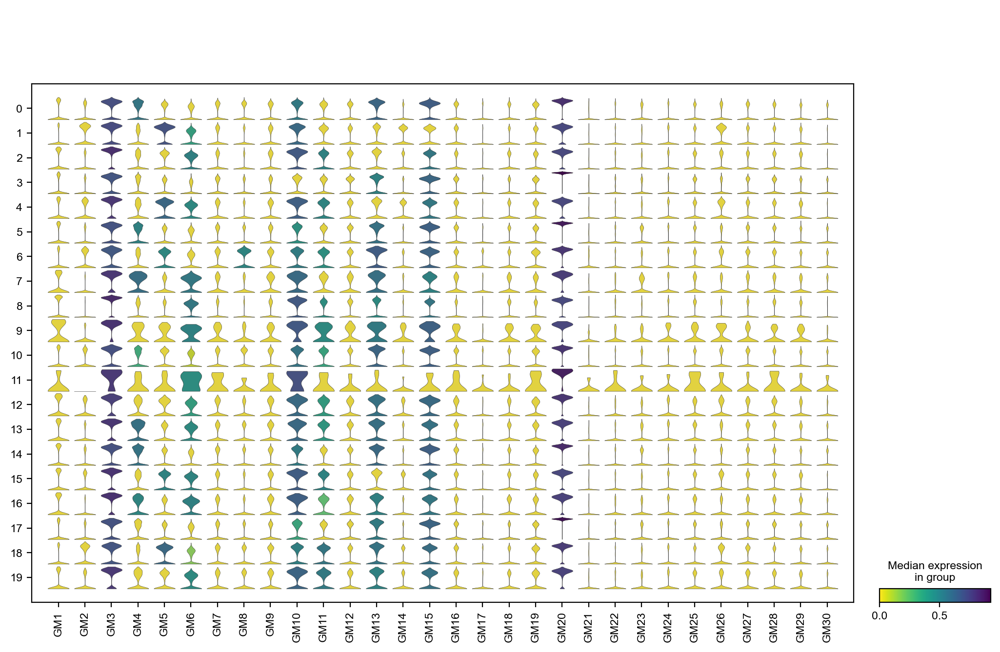

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


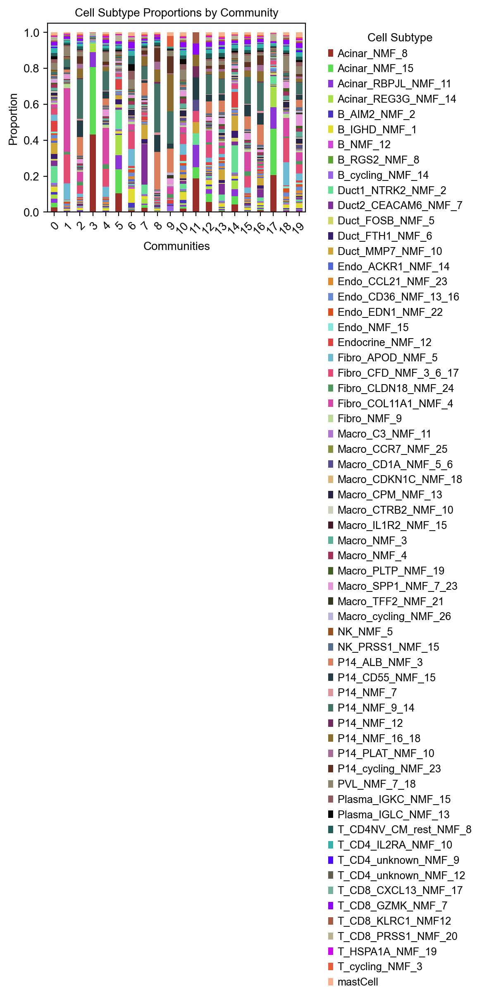

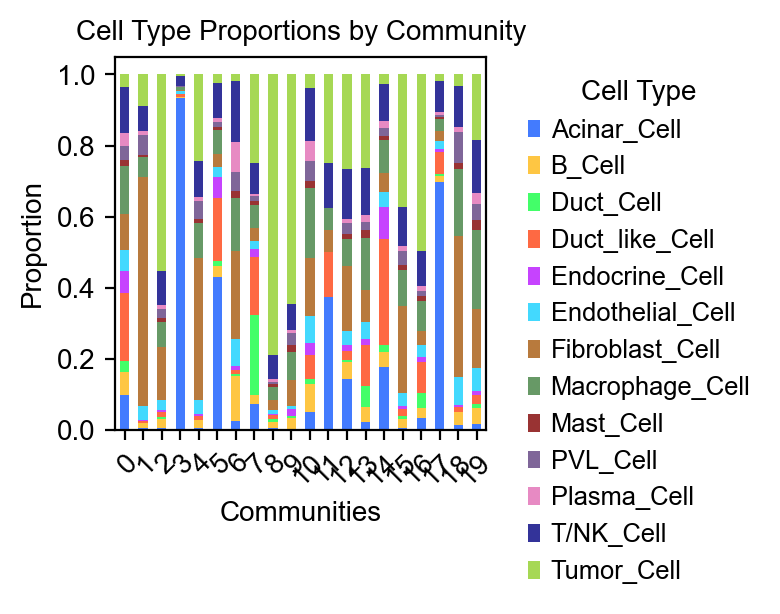

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


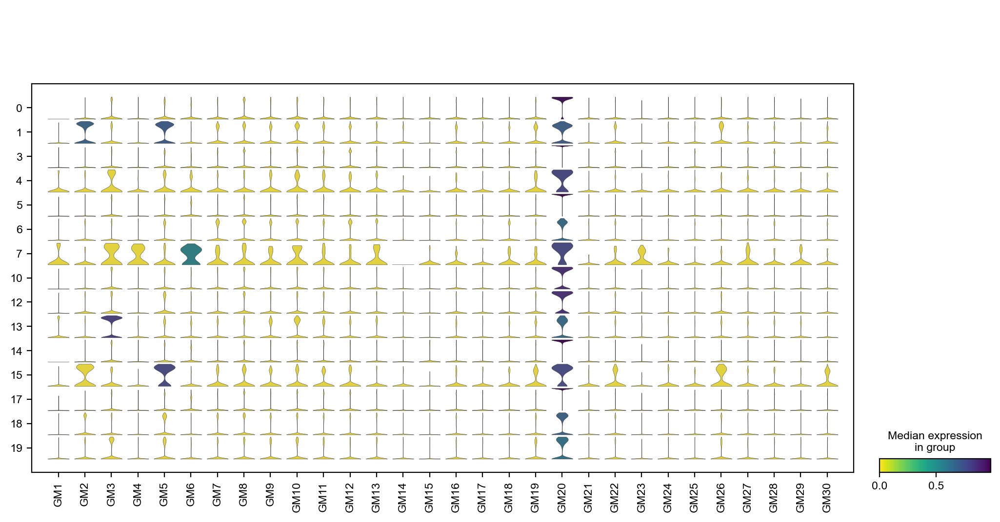

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/tmp/ipykernel_40567/204983892.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


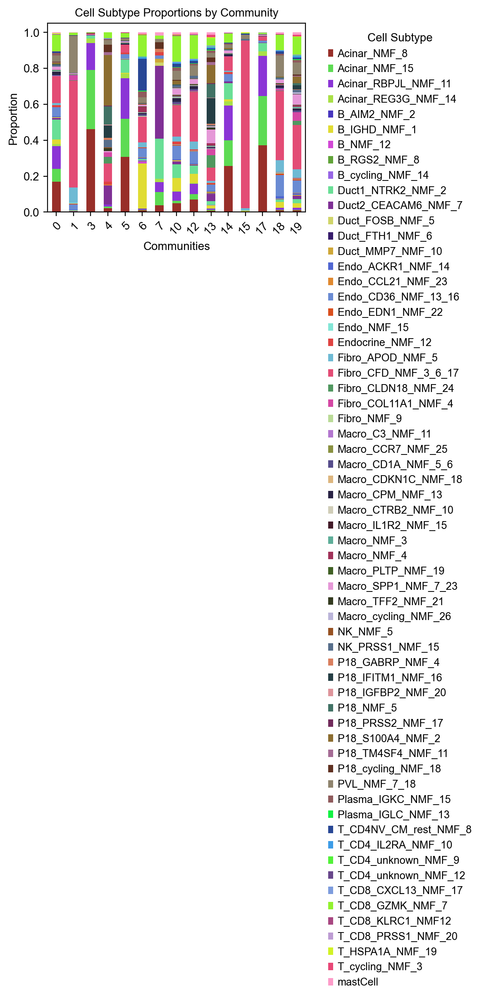

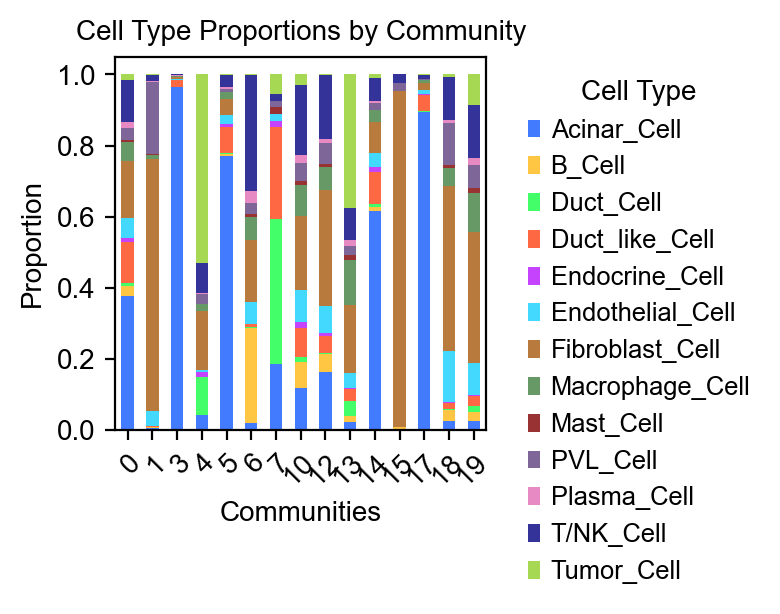

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


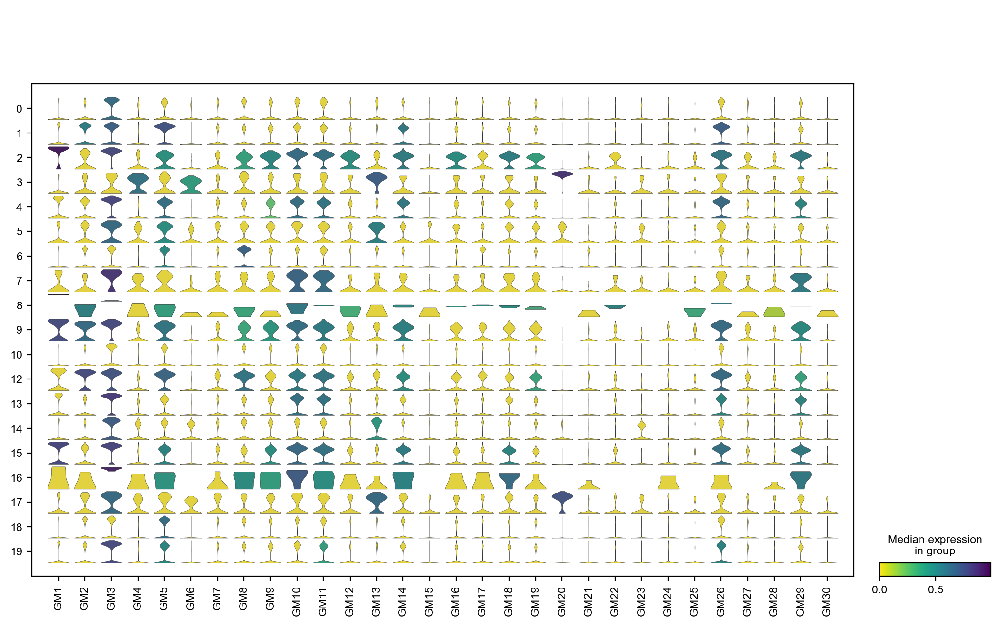

/tmp/ipykernel_40567/204983892.py:49: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


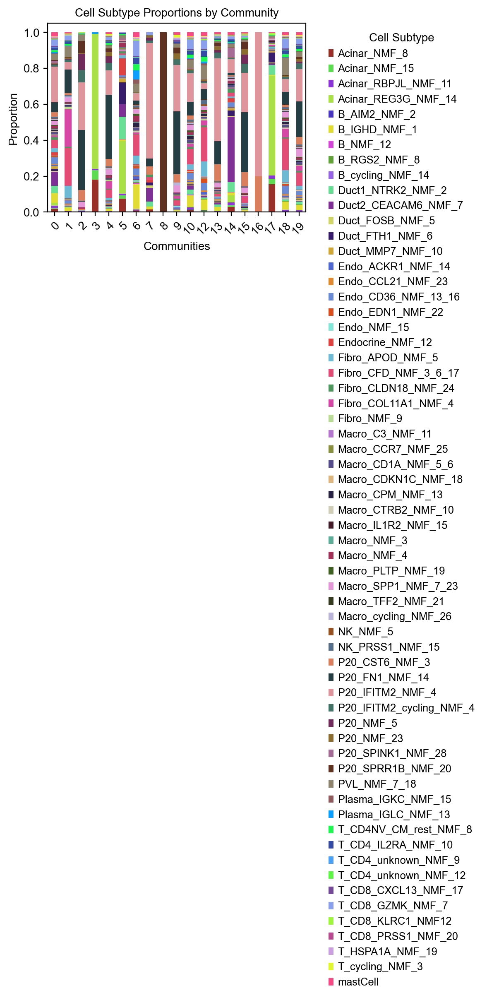

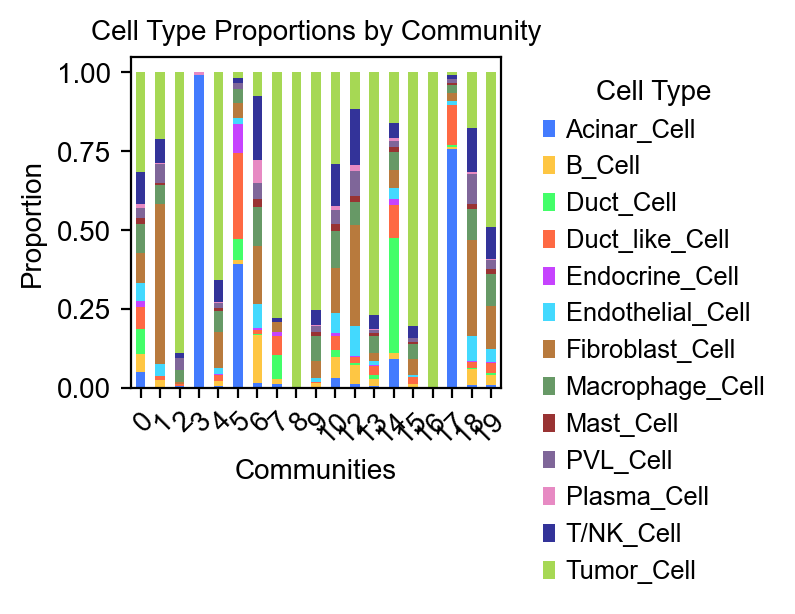

In [24]:
import numpy as np
from matplotlib import pyplot as plt
sys.path.insert(
    0,
    '/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/script/spatial_pipeline/lib'
)
from utils import getDefaultColors, removeBiasGenes, getDEG
sc._settings.ScanpyConfig(figdir='./',n_jobs=30)
# 统计每个community细胞类型成分比例和Gene module打分比例
for sample in samplelist:
    adata = merged_adata[merged_adata.obs['batch'] == sample].copy()
    adata.obs['community_type'] = adata.obs[
        'community_type'].astype('category')
    adata = adata[adata.obs['community_type'] != 'Unsigned']
    adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()
    adata.obs['celltype'] = adata.obs['celltype'].cat.remove_unused_categories()
    resolution = 'community_type'
    #画community nmf图
    GMlist = ['GM' + str(i) for i in range(1,31)]
    adata.obsm['X_nmf'] = adata.obs[GMlist]
    nmf_df = pd.DataFrame(adata.obsm['X_nmf'], index=adata.obs_names)
    sc.pl.stacked_violin(adata,
                         var_names=GMlist,
                         groupby='community_type',
                         cmap='viridis_r',
                         stripplot=False,
                         log=False,
                         standard_scale='var',
                         save=f"community_nmf_vlnplot_{sample_dict[sample]}.pdf")
    #画community中cellsubtype比例图
    filtered_data = adata.obs
    # 按照 'community_type' 和 'celltype' 进行分组，并计算细胞数量
    grouped = filtered_data.groupby(['community_type', 'cellsubtype'
                                     ]).size().unstack('cellsubtype').fillna(0)
    proportions = grouped.divide(grouped.sum(axis=1), axis=0)
    fig, axs = plt.subplots(figsize=(4, 3))
    num_colors = len(proportions.columns)
    color_palette = getDefaultColors(num_colors, type=2)
    proportions.plot(kind='bar', stacked=True, ax=axs, color=color_palette)
    axs.set_title("Cell Subtype Proportions by Community")
    axs.set_xlabel("Communities")
    axs.set_ylabel("Proportion")
    axs.legend(title="Cell Subtype",
               bbox_to_anchor=(1.05, 1),
               loc='upper left')
    axs.grid(False)
    plt.setp(axs.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
    fig.savefig(f"percent_cellsubtype_community_{sample_dict[sample]}.pdf",
                bbox_inches="tight")
    #画community中celltype比例图
    filtered_data = adata.obs
    # 按照 'community_type' 和 'celltype' 进行分组，并计算细胞数量
    grouped = filtered_data.groupby(['community_type', 'celltype'
                                     ]).size().unstack('celltype').fillna(0)
    proportions = grouped.divide(grouped.sum(axis=1), axis=0)
    fig, axs = plt.subplots(figsize=(4, 3))
    num_colors = len(proportions.columns)
    color_palette = getDefaultColors(num_colors, type=2)
    proportions.plot(kind='bar', stacked=True, ax=axs, color=color_palette)
    axs.set_title("Cell Type Proportions by Community")
    axs.set_xlabel("Communities")
    axs.set_ylabel("Proportion")
    axs.legend(title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
    axs.grid(False)
    plt.setp(axs.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
    fig.savefig(f"percent_celltype_community_{sample_dict[sample]}.pdf",
                bbox_inches="tight")

In [25]:
table = pd.pivot_table(data=adata.obs, 
                       index='community_type', 
                       columns='batch', 
                       aggfunc='size', 
                       fill_value=0)
table

batch,SS200000495BR_E3
community_type,
0,7269
1,29036
2,269
3,116
4,9447
5,542
6,26182
7,67
8,3


/tmp/ipykernel_40567/3197817472.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


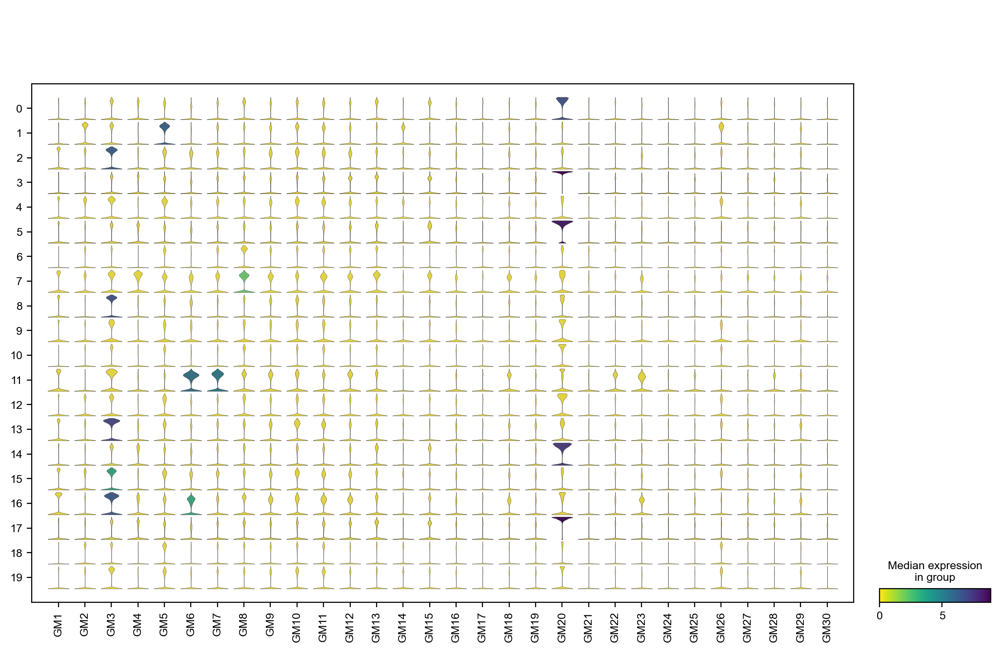

/tmp/ipykernel_40567/3197817472.py:39: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.savefig(f"percent_cellsubtype_community_all.pdf",
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


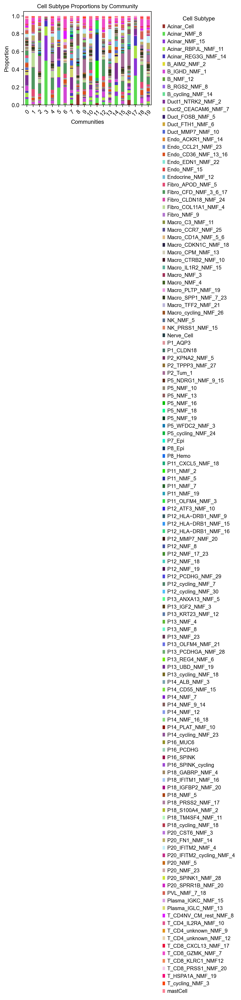

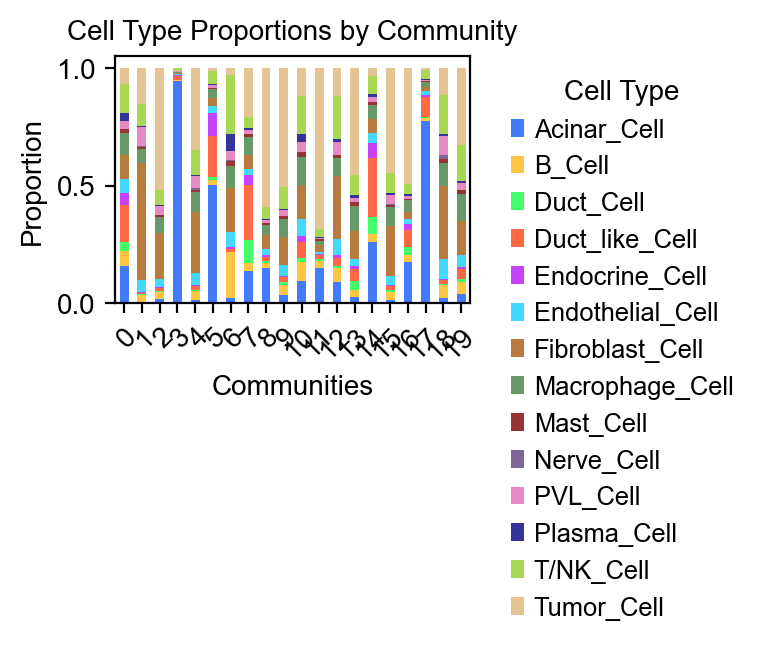

In [26]:
adata = merged_adata.copy()
adata.obs['community_type'] = adata.obs[
    'community_type'].astype('category')
adata = adata[adata.obs['community_type'] != 'Unsigned']
adata.obs['community_type'] = adata.obs['community_type'].cat.remove_unused_categories()
adata.obs['celltype'] = adata.obs['celltype'].cat.remove_unused_categories()
resolution = 'community_type'
#画community nmf图
GMlist = ['GM' + str(i) for i in range(1,31)]
adata.obsm['X_nmf'] = adata.obs[GMlist]
nmf_df = pd.DataFrame(adata.obsm['X_nmf'], index=adata.obs_names)
sc.pl.stacked_violin(adata,
                        var_names=GMlist,
                        groupby='community_type',
                        cmap='viridis_r',
                        stripplot=False,
                        log=False,
                        # standard_scale='var',
                        save=f"community_nmf_vlnplot_all.pdf")
#画community中cellsubtype比例图
filtered_data = adata.obs
# 按照 'community_type' 和 'celltype' 进行分组，并计算细胞数量
grouped = filtered_data.groupby(['community_type', 'cellsubtype'
                                    ]).size().unstack('cellsubtype').fillna(0)
proportions = grouped.divide(grouped.sum(axis=1), axis=0)
fig, axs = plt.subplots(figsize=(4, 3))
num_colors = len(proportions.columns)
color_palette = getDefaultColors(num_colors, type=2)
proportions.plot(kind='bar', stacked=True, ax=axs, color=color_palette)
axs.set_title("Cell Subtype Proportions by Community")
axs.set_xlabel("Communities")
axs.set_ylabel("Proportion")
axs.legend(title="Cell Subtype",
            bbox_to_anchor=(1.05, 1),
            loc='upper left')
axs.grid(False)
plt.setp(axs.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
fig.savefig(f"percent_cellsubtype_community_all.pdf",
            bbox_inches="tight")
#画community中celltype比例图
filtered_data = adata.obs
# 按照 'community_type' 和 'celltype' 进行分组，并计算细胞数量
grouped = filtered_data.groupby(['community_type', 'celltype'
                                    ]).size().unstack('celltype').fillna(0)
proportions = grouped.divide(grouped.sum(axis=1), axis=0)
fig, axs = plt.subplots(figsize=(4, 3))
num_colors = len(proportions.columns)
color_palette = getDefaultColors(num_colors, type=2)
proportions.plot(kind='bar', stacked=True, ax=axs, color=color_palette)
axs.set_title("Cell Type Proportions by Community")
axs.set_xlabel("Communities")
axs.set_ylabel("Proportion")
axs.legend(title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
axs.grid(False)
plt.setp(axs.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
fig.savefig(f"percent_celltype_community_all.pdf",
            bbox_inches="tight")